# SIO cyclone case 
### Brian Mapes Feb 2023

file:///Users/brianmapes/Github/stratocu_waves/DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/loop.gif

Lat-lon box: 79E-111E, 34.5S-14S, cyclones are Dingani and Freddy 

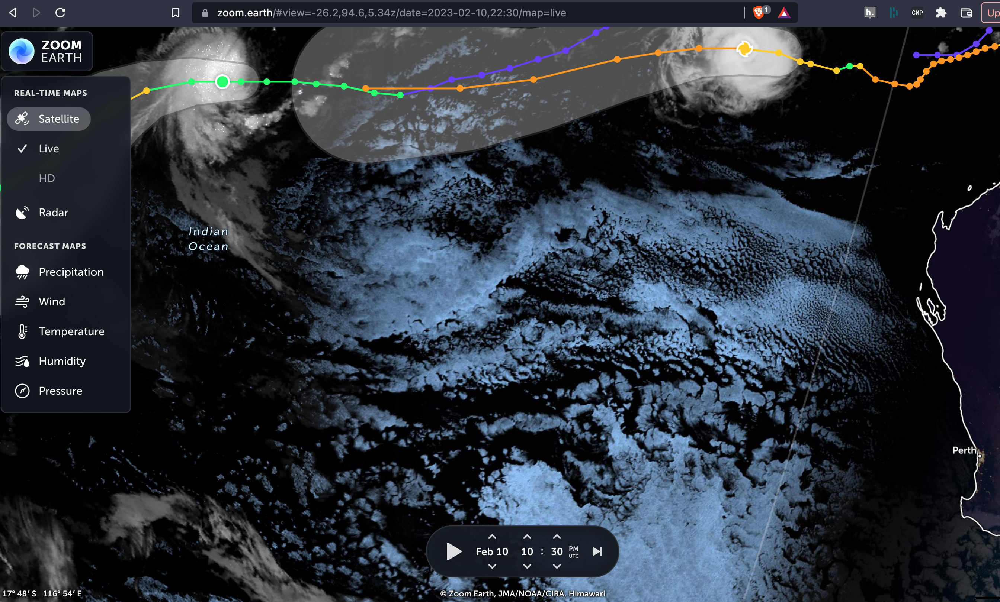

In [1]:
from openpiv import tools, pyprocess, validation, filters, scaling 

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import imageio

from scipy.ndimage import gaussian_filter as smoo

In [5]:
!ls DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Sc*.png

DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.30.58 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.31.16 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.31.30 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.33.55 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.34.04 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.34.14 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.34.24 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.34.32 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.34.39 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.34.48 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.34.58 PM.png
DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.35.07

In [248]:
#brew install ImageMagick for convert 
!convert DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Sc*.png DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/loop.gif

In [64]:
# first two (vis) 
frame_a  = tools.imread('DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.30.58 PM.png')
frame_b  = tools.imread('DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.31.16 PM.png')

# last two (IR) 
#frame_a  = tools.imread( 'DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.38.31 PM.png' ) #[:,-1024:] # Make square 1024x1024
#frame_b  = tools.imread( 'DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.38.39 PM.png' ) #[:,-1024:]

# High pass the images to make sure the tracking is not of wave velocity itself
frame_a_hp = frame_a.copy() - smoo(frame_a, 10)
frame_b_hp = frame_b.copy() - smoo(frame_b, 10)
frame_a.shape

(1300, 1882)

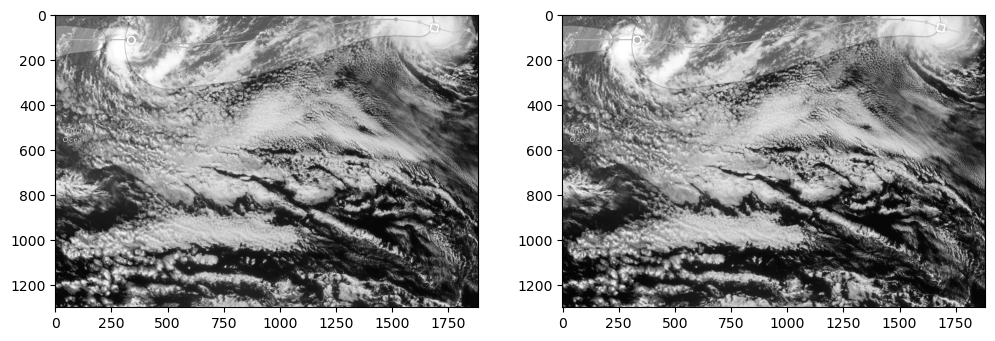

In [68]:
fig,ax = plt.subplots(1,2,figsize=(12,10))
ax[0].imshow(frame_a,cmap=plt.cm.gray, clim=[0,250])
ax[1].imshow(frame_b,cmap=plt.cm.gray, clim=[0,250])

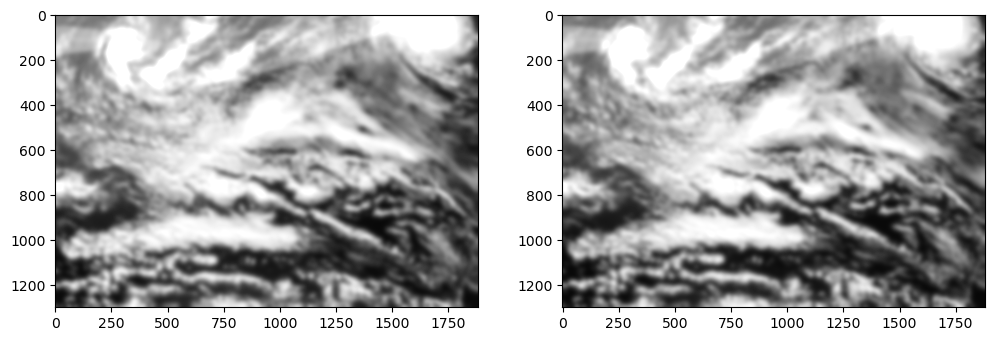

In [69]:
# Low passed images 
fig,ax = plt.subplots(1,2,figsize=(12,10))
ax[0].imshow(smoo(frame_a,10),cmap=plt.cm.gray, clim=[0,200])
ax[1].imshow(smoo(frame_b,10),cmap=plt.cm.gray, clim=[0,200])

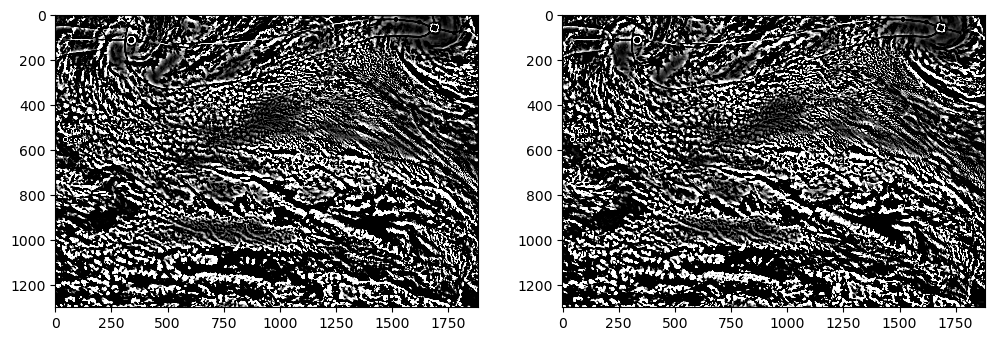

In [72]:
fig,ax = plt.subplots(1,2,figsize=(12,10))
ax[0].imshow(frame_a_hp,cmap=plt.cm.gray, clim=[0,20])
ax[1].imshow(frame_b_hp,cmap=plt.cm.gray, clim=[0,20])

In [221]:
winsize = 36 # pixels, interrogation window size in frame A
searchsize = 36  # pixels, search in image B big enough to contain credible velocity 
overlap = 18 # pixels, 50% overlap if half of winsize
dt = 1 # time interval between images, converts pixel displacement to velocity

# Coordinates of velocity positions in image array
x, y = pyprocess.get_coordinates(image_size=frame_a.shape, 
                                 search_area_size=searchsize, 
                                 overlap=overlap )

In [236]:
# Use high-pass images as the PIV source frame_a_hp, frame_b_hp

u, v, sig2noise = pyprocess.extended_search_area_piv(  frame_a_hp.astype(np.int32), 
                                                       frame_b_hp.astype(np.int32), 
                                                       window_size=winsize, 
                                                       overlap=overlap, 
                                                       dt=dt, 
                                                       search_area_size=searchsize, 
                                                       sig2noise_method='peak2mean')
# return u/dt, v/dt, sig2noise

In [237]:
# Full image as the PIV source 

#u, v, sig2noise = pyprocess.extended_search_area_piv(frame_a.astype(np.int32), 
#                                                       frame_b.astype(np.int32), 
#                                                       window_size=winsize, 
#                                                       overlap=overlap, 
#                                                       dt=dt, 
#                                                       search_area_size=searchsize, 
#                                                       sig2noise_method='peak2mean')
# return u/dt, v/dt, sig2noise

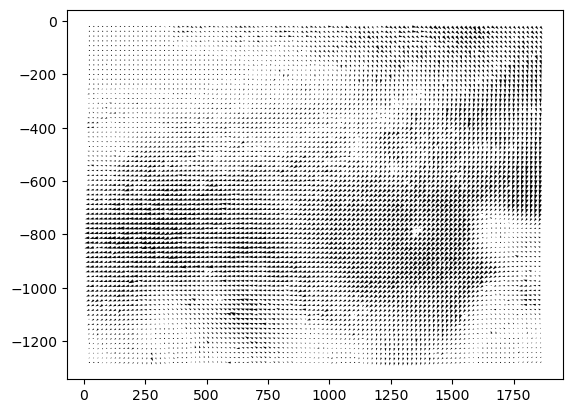

In [258]:
plt.quiver(x,-y, u,-v)

## Couple problems evident. 

1. zeroes (subpixel values) 
2. outliers from local values

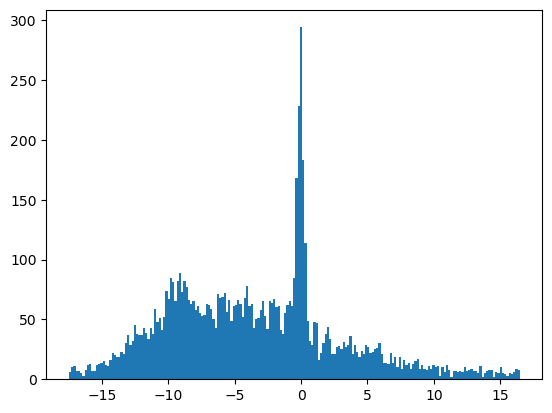

In [239]:
plt.hist(u.ravel(),201);  # units are pixels

# Clobber large vectors 
# u, v, mask = validation.global_val(u, v, [-15,10], [-10,10])

In [240]:
# Kill the spike around 0 in both u and v (less than given magnitude) 
toosmall = 0.5 
ind = np.logical_or(
        np.logical_and(u >= -toosmall, u <= toosmall),
        np.logical_and(v >= -toosmall, v <= toosmall),
    )

u[ind] = np.nan
v[ind] = np.nan

mask = np.zeros_like(u, dtype=bool)
mask[ind] = True

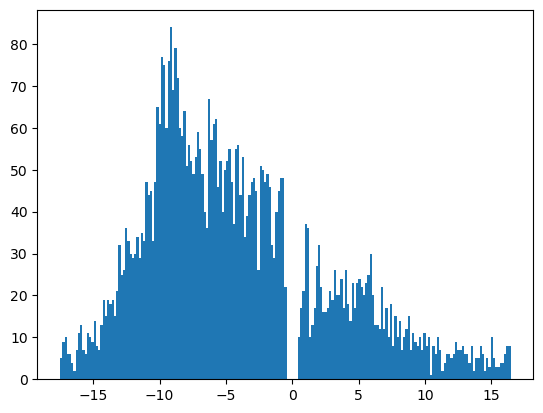

In [241]:
plt.hist(u.ravel(),201);  # units are pixels

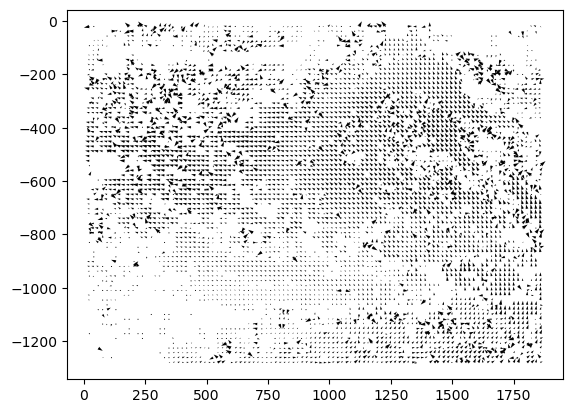

In [242]:
plt.quiver(x,-y, u,-v)

In [243]:
# Median filter: anything beyond 4 pixels/interval from a 3x3 median 
u,v,mask = validation.local_median_val(u, v, 4, 4, size=3)

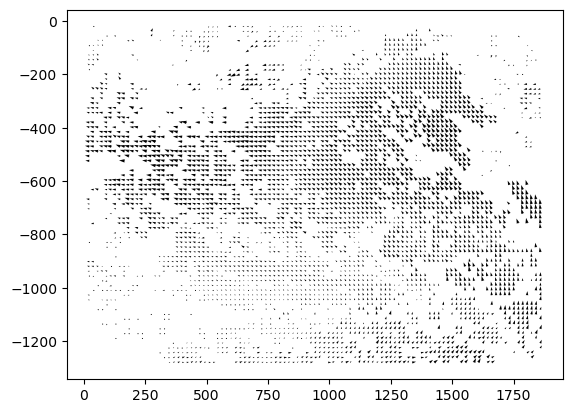

In [244]:
plt.quiver(x,-y, u,-v)

In [245]:
# Fill gaps a bit
u, v = filters.replace_outliers( u, v, 
                                  method='localmean', 
                                  max_iter=10, 
                                  kernel_size=3)

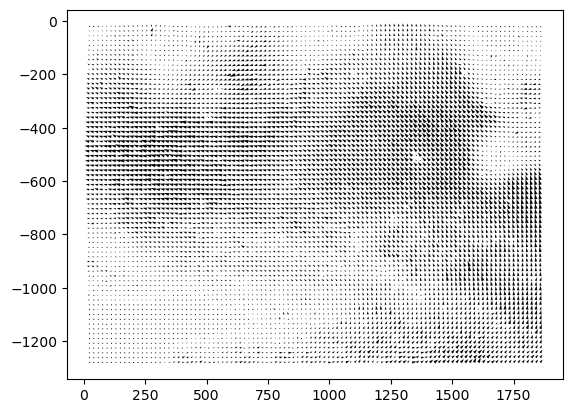

In [246]:
plt.quiver(x,-y, u,-v)

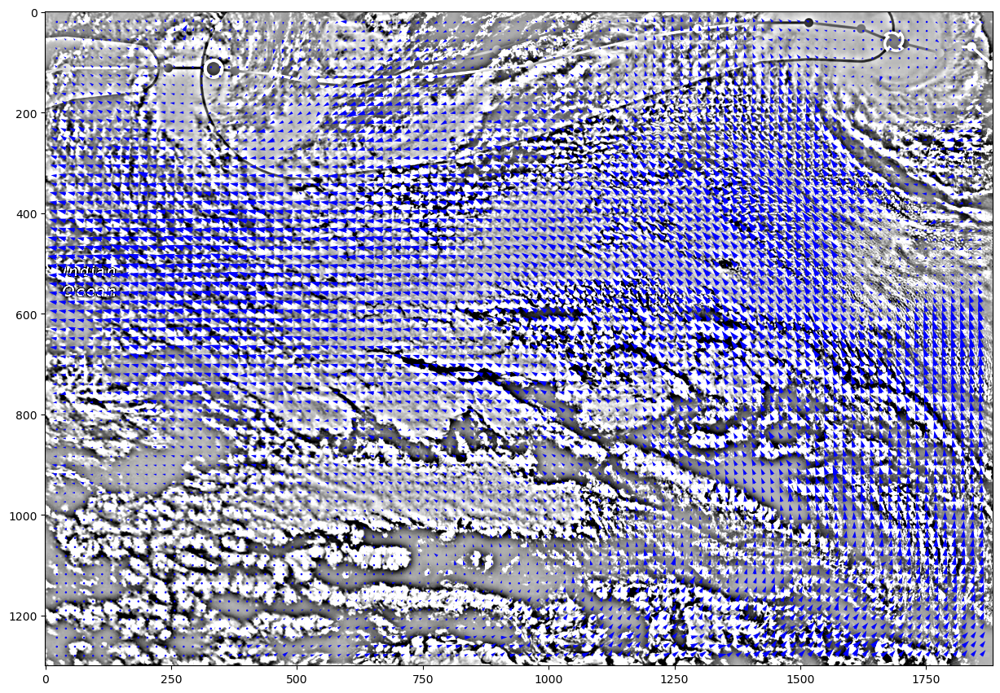

In [252]:
plt.figure(figsize=(15,20))

plt.imshow(frame_b_hp,cmap=plt.cm.gray, clim=[-50,20])   #-frame_a)
plt.quiver(x,y, u,-v, color='b')

In [206]:
#v[skip]

In [253]:
#save in the simple ASCII table format
# image coords to xy coords: 0,0 shall be bottom left, positive rotation rate is counterclockwise

x, y, u, v = tools.transform_coordinates(x, y, u, v)

skip = (slice(None, None, 3), slice(None, None, 3))

tools.save(x[skip], y[skip], u[skip], v[skip], mask[skip], 'exp1_001.txt' )

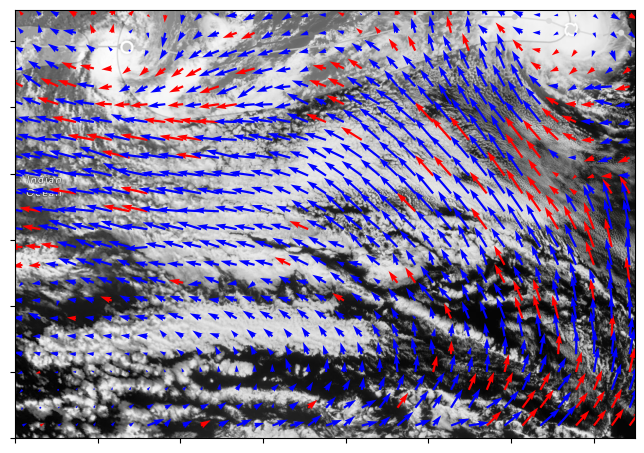

In [254]:
# Display from that file 
import tools  # My own version, does not use negative(im)

fig, ax = plt.subplots(figsize=(8,10))
tools.display_vector_field('exp1_001.txt', 
                           ax=ax, 
                           scale=300, # scale defines here the arrow length, but inversely
                           width=0.0035, # width is the thickness of the arrow
                           on_img=True, # overlay on the first image
                           image_name='DATA/SouthIndianOcean_TC_Vis_IR_halfhourly/Screen Shot 2023-02-10 at 7.30.58 PM.png');

In [255]:
from scipy.ndimage import gaussian_filter as smoo

In [256]:
divx = np.gradient(u)[1]
divy = -np.gradient(v)[0]
div = divx+divy # confirmed visually in sign  

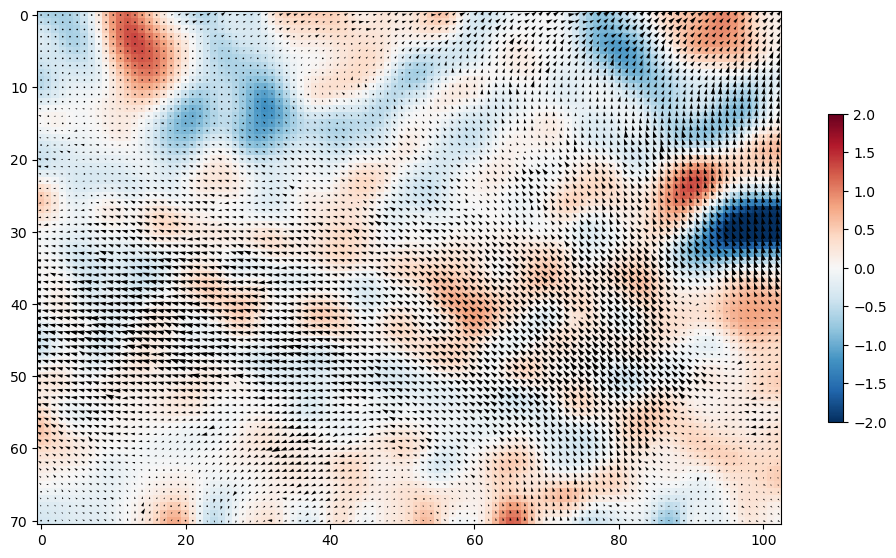

In [257]:
fig,ax = plt.subplots(figsize=(12,8))

plt.imshow(smoo(div, 2), cmap='RdBu_r'); 
plt.clim([-2,2]); plt.colorbar(shrink=0.5)

plt.quiver( (x-x.min()) /winsize*2, (y-y.min()) /winsize*2, u,v)

In [214]:
# functions for constructing wavenumber and angle, for filtering masks 
def distance_from(a, index):
    i,j = np.indices(a.shape, sparse=True)
    return np.sqrt((i-index[0])**2 + (j-index[1])**2)
def angle_from(a, index):
    i,j = np.indices(a.shape, sparse=True)
    return np.arctan2((j-index[1]),(i-index[0]))

(-0.5, 59.5, 59.5, -0.5)

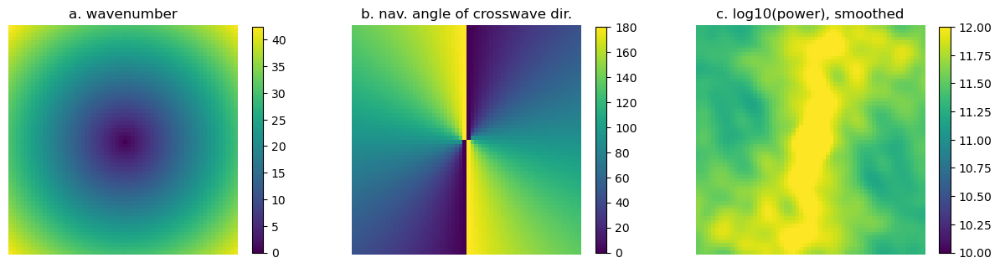

In [215]:
# Fourier transform and shift to center and total wavenumber array kl
diff = frame_b-frame_a
diffhat = np.fft.fftshift(np.fft.fft2(diff))

# Power
power = np.abs(diffhat)**2

# Wavenumbers 
kl = distance_from(diffhat, [diffhat.shape[0]/2, diffhat.shape[1]/2] )

# Angles are redundant SW-NE or NW-SE 
rose = angle_from(diffhat, [diffhat.shape[0]/2, diffhat.shape[1]/2] )
centerline = rose.shape[1]//2
rose[:,0:centerline] = np.flipud(np.fliplr( rose[:,centerline:] ))  
rose = np.flipud(rose)
rose *= 180./np.pi # degrees


# Show the spectrum and spectral coordinates 
box = (slice(diffhat.shape[0]//2-30, diffhat.shape[0]//2+30,1), slice(diffhat.shape[1]//2 -30 ,diffhat.shape[1]//2 + 30,1))

plt.figure(figsize=[15,5])
plt.subplot(1, 3, 1)
plt.imshow(kl[box]); plt.title('a. wavenumber'); plt.colorbar(shrink=0.7); plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(rose[box]); plt.title('b. nav. angle of crosswave dir.'); plt.colorbar(shrink=0.7); plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(np.log10(smoo(power,2)[box]),clim=[10,12]); plt.title('c. log10(power), smoothed'); plt.colorbar(shrink=0.7); plt.axis('off')

Text(0.5, 1.0, 'filtered d/dt(brightness)')

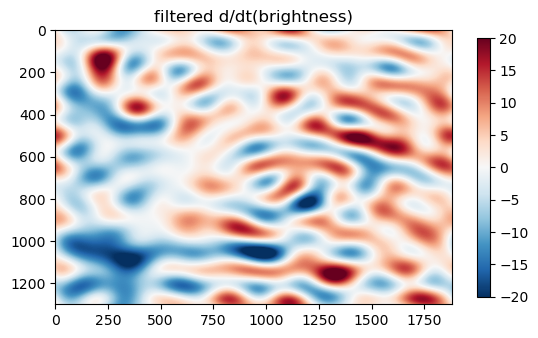

In [216]:
# Filter and reconstruct 
mask = (  (kl>0) & (kl<=10) )  #& ( (rose<10) | (rose>170) )   )
        
recon = np.fft.ifft2( np.fft.ifftshift( diffhat*mask ))

plt.imshow(recon.real, cmap='RdBu_r')
plt.clim(-20,20); plt.colorbar(shrink=0.7); plt.title('filtered d/dt(brightness)')

Text(0.5, 1.0, 'convergence of PIV velocities')

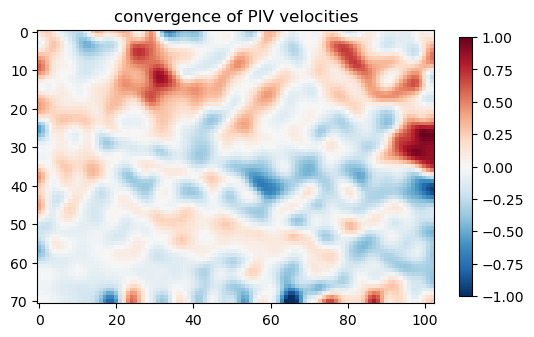

In [217]:
# Does it match divergence of the PIV winds? 
plt.imshow(smoo(-div, 2), cmap='RdBu_r', clim=[-1,1]); plt.colorbar(shrink=0.7)
plt.title('convergence of PIV velocities')

(500.0, 1400.0)

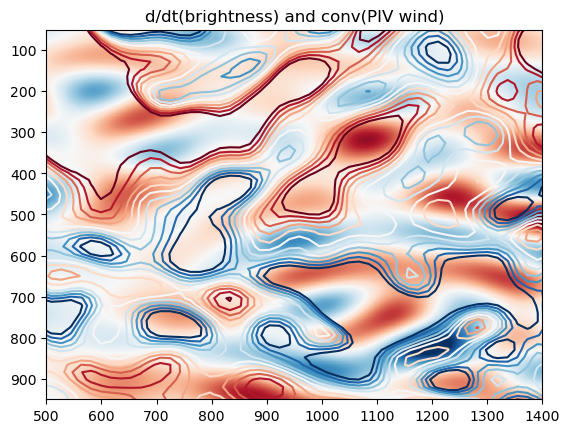

In [218]:
# overlay 

plt.pcolormesh(recon.real, cmap='RdBu_r')
plt.clim(-20,20); plt.title('d/dt(brightness) and conv(PIV wind)')

plt.contour(x,y, np.flipud(smoo(-div, 2)), levels=(-5+np.arange(11))/20., cmap='RdBu_r')
plt.ylim(950,50); plt.xlim(500,1400)
#plt.axis('off')

In [34]:
# Spectral grouping and binning and averaging 

In [35]:
import pandas as pd

In [36]:
# Take some relevant values, low wavenmubers, into a dataframe for groupby

mask = (  (kl>1) & (kl<30) )
df = pd.DataFrame([power[mask].ravel(),kl[mask].ravel(),rose[mask].ravel()], 
                  ['P','k','angle']).transpose()

In [37]:
df

,P,k,angle
0,1.660424e+11,29.832868,168.310631
1,1.185293e+11,29.614186,170.217593
2,2.049822e+11,29.427878,172.146687
3,9.973504e+10,29.274562,174.093859
4,4.289711e+11,29.154759,176.054814
...,...,...,...
2799,4.289711e+11,29.154759,174.289407
2800,9.973504e+10,29.274562,172.405357
2801,2.049822e+11,29.427878,170.537678
2802,1.185293e+11,29.614186,168.690068


<AxesSubplot: xlabel='k'>

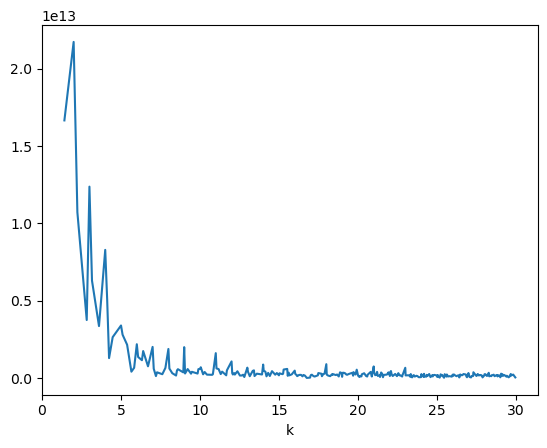

In [38]:
# Power spectrum 
df.groupby(df.k).mean().P.plot()

In [39]:
ANS = df.groupby([df.k,df.angle]).mean()

In [40]:
ANS

P
k         angle                   
1.414214  0.000000    1.779948e+13
          90.000000   1.779948e+13
          153.434949  1.551099e+13
          180.000000  1.551099e+13
2.000000  0.000000    9.801949e+12
...                            ...
29.966648 66.037511   9.134751e+09
          116.565051  9.250904e+09
          117.407575  9.250904e+09
          155.095231  5.120592e+10
          156.037511  5.120592e+10

[2764 rows x 1 columns]